In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

In [2]:
print("Tensorflow version: ", tf.__version__)

Tensorflow version:  2.19.0


In [3]:
"""
Chuẩn bị dữ liệu
Dữ liệu được lưu và tổ chức trong máy theo cấu trúc sau:
    PetImages/
        Cat/
            0.jpg
            1.jpg
            2.jpg
            ...

        Dog/
            0.jpg
            1.jpg
            2.jpg
            ...
"""

'\nChuẩn bị dữ liệu\nDữ liệu được lưu và tổ chức trong máy theo cấu trúc sau:\n    PetImages/\n        Cat/\n            0.jpg\n            1.jpg\n            2.jpg\n            ...\n\n        Dog/\n            0.jpg\n            1.jpg\n            2.jpg\n            ...\n'

In [4]:
#create dataframe for input and output
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/" + class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages",class_name, path))

print(input_path[0], label[0])

PetImages\Cat\0.jpg 0


In [5]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()


,images,label
0,PetImages\Dog\12049.jpg,1
1,PetImages\Cat\8515.jpg,0
2,PetImages\Cat\9369.jpg,0
3,PetImages\Dog\1655.jpg,1
4,PetImages\Dog\11615.jpg,1


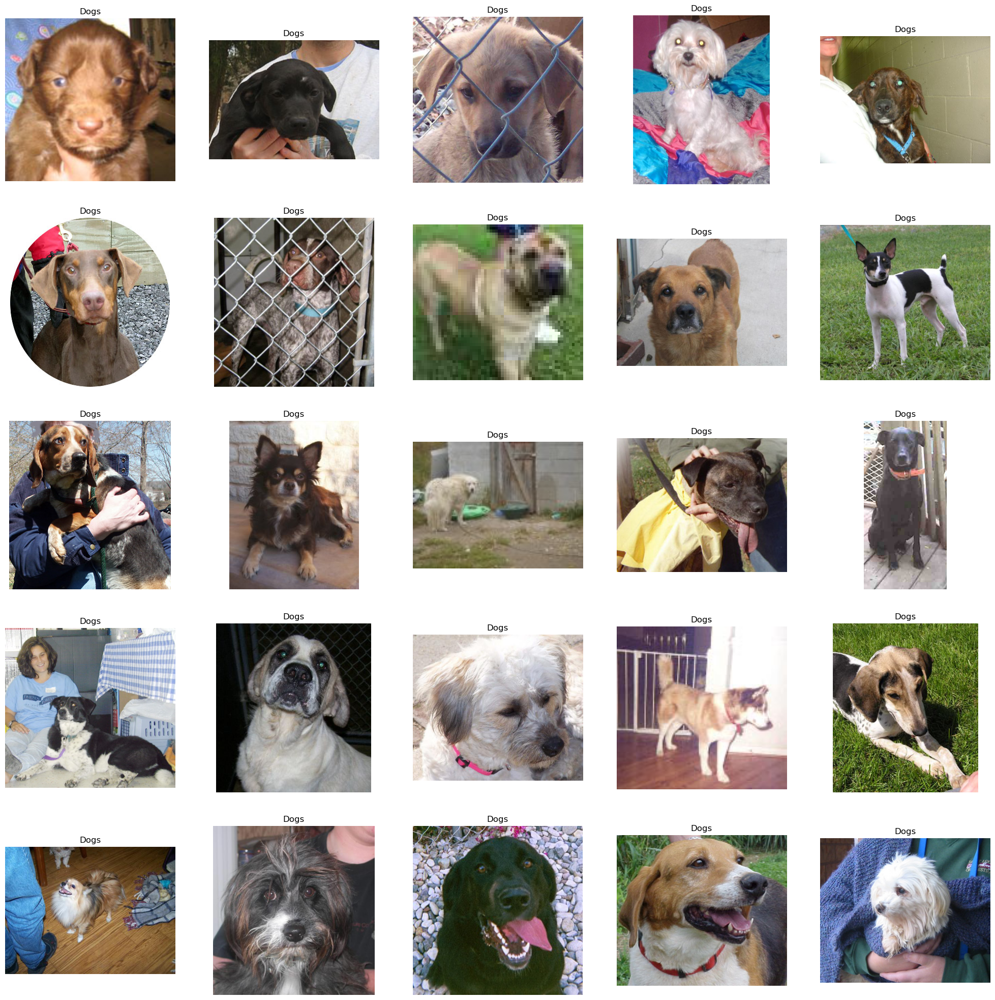

In [6]:
#exploratory data analyst
#display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

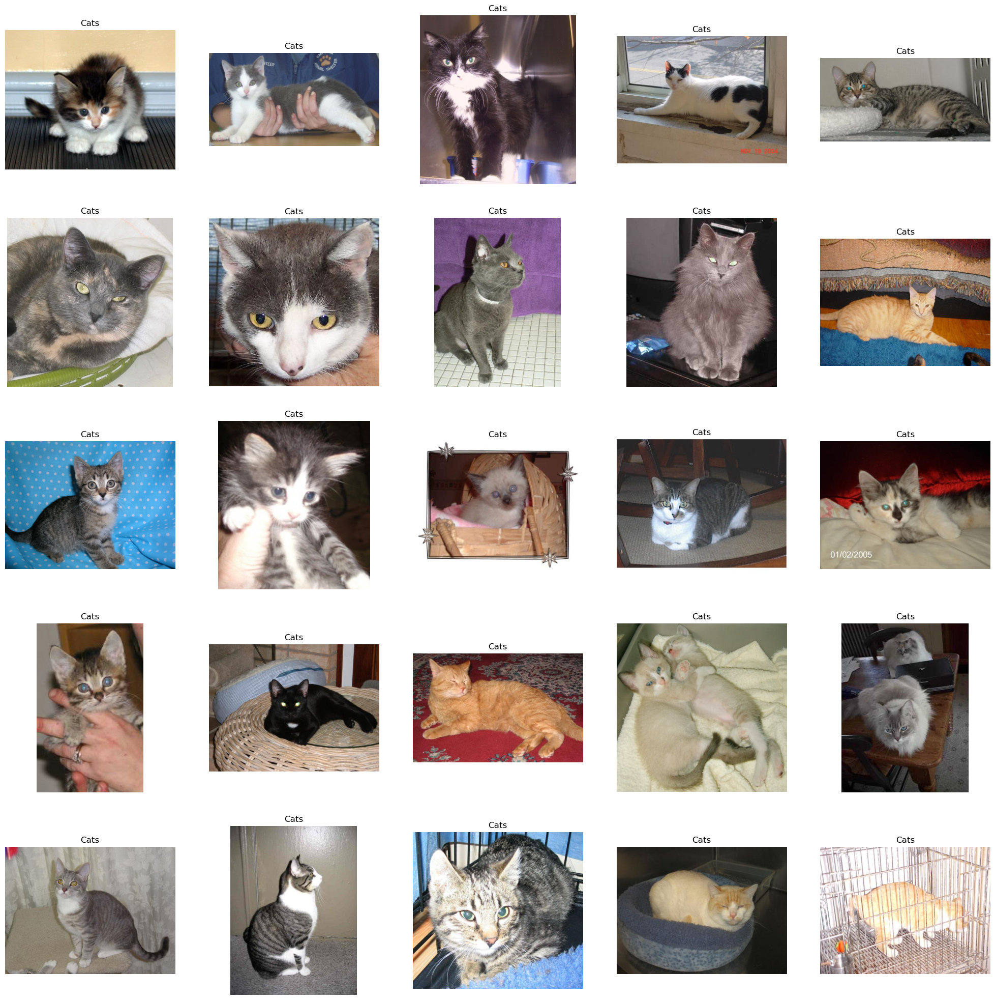

In [7]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

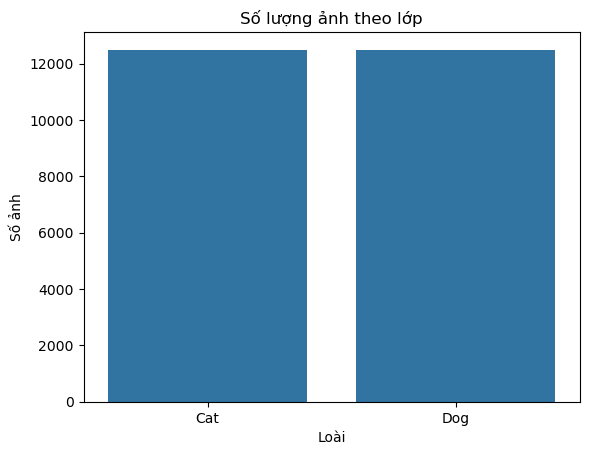

In [8]:

import seaborn as sns

sns.countplot(x='label', data=df)
plt.xticks([0, 1], ['Cat', 'Dog'])
plt.title("Số lượng ảnh theo lớp")
plt.xlabel("Loài")
plt.ylabel("Số ảnh")
plt.show()


In [9]:
df['label'] = df['label'].astype('str')
df.head()

,images,label
0,PetImages\Dog\12049.jpg,1
1,PetImages\Cat\8515.jpg,0
2,PetImages\Cat\9369.jpg,0
3,PetImages\Dog\1655.jpg,1
4,PetImages\Dog\11615.jpg,1


In [10]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [26]:
#create datagenerator for the images
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 30, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=[0.7, 1.3],
    horizontal_flip = True,
    fill_mode = 'nearest'
)
val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [45]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.regularizers import l2

model = Sequential([
    keras.Input(shape=(128, 128, 3)),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.BatchNormalization(), 
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64, (3,3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

In [46]:


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 126, 126, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 61, 61, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 28, 28, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,305,665 (12.61 MB)

 Trainable params: 3,305,217 (12.61 MB)

 Non-trainable params: 448 (1.75 KB)

In [50]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


history = model.fit(
    train_iterator,
    epochs=25,
    validation_data=val_iterator,
    callbacks=[early_stop]
)

Epoch 1/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 356s 9s/step - accuracy: 0.6387 - loss: 0.6097 - val_accuracy: 0.5278 - val_loss: 3.2870
Epoch 2/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 408s 10s/step - accuracy: 0.6810 - loss: 0.5876 - val_accuracy: 0.5042 - val_loss: 3.2029
Epoch 3/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 535s 13s/step - accuracy: 0.6966 - loss: 0.5677 - val_accuracy: 0.5030 - val_loss: 1.4299
Epoch 4/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 457s 11s/step - accuracy: 0.7069 - loss: 0.5494 - val_accuracy: 0.5096 - val_loss: 1.1637
Epoch 5/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 436s 11s/step - accuracy: 0.7143 - loss: 0.5410 - val_accuracy: 0.5342 - val_loss: 1.1041
Epoch 6/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 452s 11s/step - accuracy: 0.7275 - loss: 0.5281 - val_accuracy: 0.5544 - val_loss: 0.9707
Epoch 7/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 371s 9s/step - accuracy: 0.7273 - loss: 0.5229 - val_accuracy: 0.6224 - val_loss: 0.7275
Epoch 8/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 355s 9s/step - accuracy: 0.7601 - loss: 0.4936 - val_accuracy: 0.701

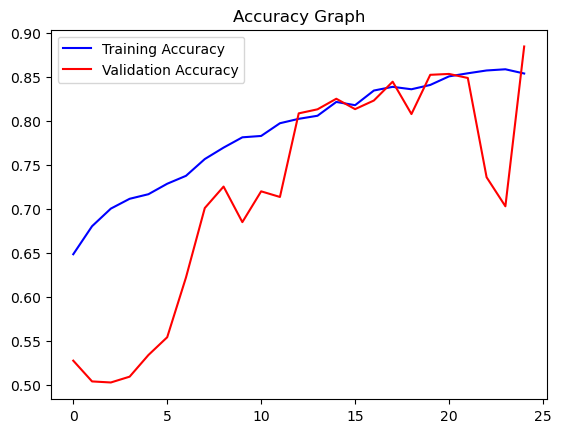

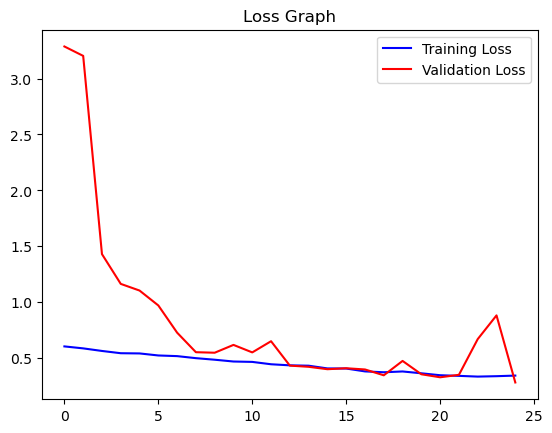

In [51]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [1]:
from PIL import Image


image_path = "test1.jpg"

img = load_img(image_path, target_size=(128, 128))
img = np.array(img) / 255.0
img = img.reshape(1, 128, 128, 3)

pred = model.predict(img)
label = 'Dog' if pred[0][0] > 0.5 else 'Cat'
confidence = pred[0][0] if pred[0][0] > 0.5 else 1 - pred[0][0] 

original_img = Image.open(image_path)
plt.imshow(original_img)
plt.axis('off')
plt.title(f"Prediction: {label} ({confidence*100:.2f}%)", fontsize=14)
plt.show()

NameError: name 'load_img' is not defined

In [63]:
model.save('cat_dog_classifier_final.h5')
print("Saved successfully")

Saved successfully
